In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from tqdm import tqdm

In [2]:

# Custom Dataset class to handle TIFF stacks
class TiffDataset(Dataset):
    def __init__(self, image_path, mask_path, transform=None):
        self.images = imread(image_path)
        self.masks = imread(mask_path)
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]
        
        # Convert single-channel image to three channels
        image = np.stack([image] * 3, axis=-1)

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        
        # Ensure the mask is a single channel
        mask = mask[0, :, :].unsqueeze(0)
        
        return image, mask

# Define the U-Net model with ResNet18 backbone
class UNetResNet18(nn.Module):
    def __init__(self, n_classes):
        super(UNetResNet18, self).__init__()
        self.base_model = models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.encoder1 = nn.Sequential(*self.base_layers[:3])
        self.encoder2 = nn.Sequential(*self.base_layers[3:5])
        self.encoder3 = self.base_layers[5]
        self.encoder4 = self.base_layers[6]
        self.encoder5 = self.base_layers[7]

        self.center = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.decoder5 = self._decoder_block(512 + 512, 512)
        self.decoder4 = self._decoder_block(512 + 256, 256)
        self.decoder3 = self._decoder_block(256 + 128, 128)
        self.decoder2 = self._decoder_block(128 + 64, 64)
        self.decoder1 = self._decoder_block(64 + 64, 64)

        self.final_conv = nn.Conv2d(64, n_classes, kernel_size=1)

    def _decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(out_channels, out_channels, kernel_size=2, stride=2)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        enc5 = self.encoder5(enc4)

        center = self.center(enc5)

        dec5 = self.decoder5(torch.cat([center, self._crop(enc5, center)], 1))
        dec4 = self.decoder4(torch.cat([dec5, self._crop(enc4, dec5)], 1))
        dec3 = self.decoder3(torch.cat([dec4, self._crop(enc3, dec4)], 1))
        dec2 = self.decoder2(torch.cat([dec3, self._crop(enc2, dec3)], 1))
        dec1 = self.decoder1(torch.cat([dec2, self._crop(enc1, dec2)], 1))

        final = self.final_conv(dec1)
        return self._resize(final, x.size()[2:])

    def _crop(self, enc, dec):
        _, _, H, W = dec.size()
        enc = transforms.CenterCrop([H, W])(enc)
        return enc

    def _resize(self, input, size):
        return nn.functional.interpolate(input, size=size, mode='bilinear', align_corners=True)

# Transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((768, 768))  # Ensure the size is a multiple of 32
])

# Load dataset
dataset = TiffDataset('./data/cam-labeled-images-15.tif', './data/cam-labeled-masks-15.tif', transform=transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

# Check for GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the model, loss function, and optimizer
model = UNetResNet18(n_classes=1).to(device)  # Move model to GPU if available
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 20

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    for images, masks in tqdm(dataloader):
        images, masks = images.to(device), masks.to(device)  # Move data to GPU if available

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss/len(dataloader)}')

# Save the trained model
torch.save(model.state_dict(), 'unet-cam-labeled-15_resnet18.pth')

# Visualize some predictions
model.eval()
with torch.no_grad():
    for i in range(3):
        image, mask = dataset[i]
        image = image.unsqueeze(0).to(device)  # Move data to GPU if available
        output = model(image)
        output = torch.sigmoid(output).cpu().squeeze().numpy()

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image.cpu().squeeze().permute(1, 2, 0).numpy(), cmap='gray')
        axes[0].set_title('Input Image')
        axes[1].imshow(mask.cpu().squeeze().numpy(), cmap='gray')
        axes[1].set_title('Ground Truth')
        axes[2].imshow(output, cmap='gray')
        axes[2].set_title('Prediction')
        plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/20, Loss: 0.08770965526346117


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 2/20, Loss: 0.0037928112875670193


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 3/20, Loss: 0.0034047408076003194


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 4/20, Loss: 0.0032917740242555736


  4%|▍         | 2/50 [00:06<02:45,  3.45s/it]

KeyboardInterrupt: 

In [3]:
# Save the trained model
torch.save(model.state_dict(), 'unet-cam-labeled-15_resnet18.pth')

In [ ]:
# Visualize some predictions
model.eval()
with torch.no_grad():
    for i in range(100):
        image, mask = dataset[i]
        image = image.unsqueeze(0).to(device)  # Move data to GPU if available
        output = model(image)
        output = torch.sigmoid(output).cpu().squeeze().numpy()

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image.cpu().squeeze().permute(1, 2, 0).numpy(), cmap='gray')
        axes[0].set_title('Input Image')
        axes[1].imshow(mask.cpu().squeeze().numpy(), cmap='gray')
        axes[1].set_title('Ground Truth')
        axes[2].imshow(output, cmap='gray')
        axes[2].set_title('Prediction')
        plt.show()

In [5]:

# Custom Dataset class to handle TIFF stacks
class TiffDataset(Dataset):
    def __init__(self, image_path, mask_path=None, transform=None):
        self.images = imread(image_path)
        self.masks = imread(mask_path) if mask_path else None
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        
        # Convert single-channel image to three channels
        image = np.stack([image] * 3, axis=-1)
        
        # Convert image type to uint8
        image = (image / image.max() * 255).astype(np.uint8)

        if self.transform:
            image = self.transform(image)
        
        if self.masks is not None:
            mask = self.masks[idx]
            mask = self.transform(mask)
            # Ensure the mask is a single channel
            mask = mask[0, :, :].unsqueeze(0)
            return image, mask
        else:
            return image

# Define the U-Net model with ResNet18 backbone
class UNetResNet18(nn.Module):
    def __init__(self, n_classes):
        super(UNetResNet18, self).__init__()
        self.base_model = models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.encoder1 = nn.Sequential(*self.base_layers[:3])
        self.encoder2 = nn.Sequential(*self.base_layers[3:5])
        self.encoder3 = self.base_layers[5]
        self.encoder4 = self.base_layers[6]
        self.encoder5 = self.base_layers[7]

        self.center = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.decoder5 = self._decoder_block(512 + 512, 512)
        self.decoder4 = self._decoder_block(512 + 256, 256)
        self.decoder3 = self._decoder_block(256 + 128, 128)
        self.decoder2 = self._decoder_block(128 + 64, 64)
        self.decoder1 = self._decoder_block(64 + 64, 64)

        self.final_conv = nn.Conv2d(64, n_classes, kernel_size=1)

    def _decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(out_channels, out_channels, kernel_size=2, stride=2)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        enc5 = self.encoder5(enc4)

        center = self.center(enc5)

        dec5 = self.decoder5(torch.cat([center, self._crop(enc5, center)], 1))
        dec4 = self.decoder4(torch.cat([dec5, self._crop(enc4, dec5)], 1))
        dec3 = self.decoder3(torch.cat([dec4, self._crop(enc3, dec4)], 1))
        dec2 = self.decoder2(torch.cat([dec3, self._crop(enc2, dec3)], 1))
        dec1 = self.decoder1(torch.cat([dec2, self._crop(enc1, dec2)], 1))

        final = self.final_conv(dec1)
        return self._resize(final, x.size()[2:])

    def _crop(self, enc, dec):
        _, _, H, W = dec.size()
        enc = transforms.CenterCrop([H, W])(enc)
        return enc

    def _resize(self, input, size):
        return nn.functional.interpolate(input, size=size, mode='bilinear', align_corners=True)

# Transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((768, 768))  # Ensure the size is a multiple of 32
])

# Load the new dataset to segment
segment_dataset = TiffDataset('./data/data-to-segment-1500.tif', transform=transform)
segment_dataloader = DataLoader(segment_dataset, batch_size=1, shuffle=False)

# Check for GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



100%|██████████| 84/84 [00:33<00:00,  2.51it/s]


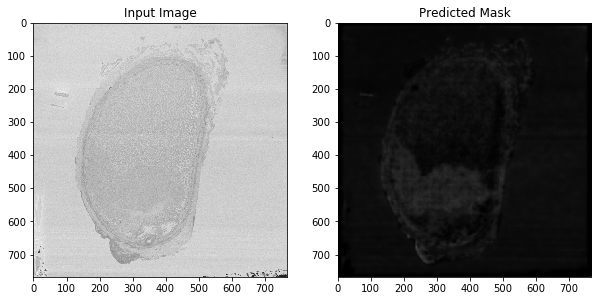

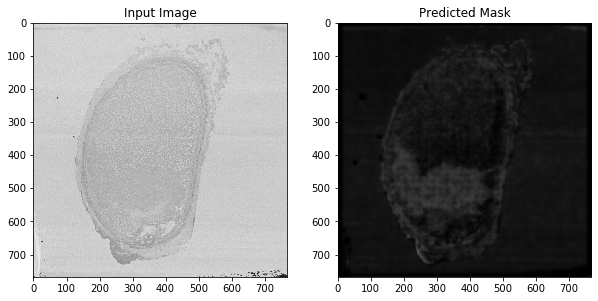

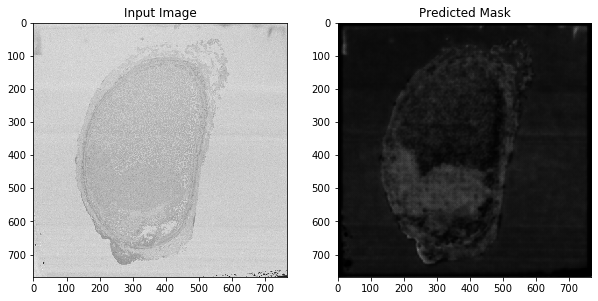

In [6]:
# Initialize the model and load the trained weights
model = UNetResNet18(n_classes=1).to(device)  # Move model to GPU if available
model.load_state_dict(torch.load('unet-cam-labeled-15_resnet18.pth'))
model.eval()

# Function to save predictions as TIFF stack
def save_predictions_as_tiff(predictions, output_path):
    imsave(output_path, np.array(predictions, dtype=np.uint8))

# Make predictions and save the results
predictions = []
with torch.no_grad():
    for images in tqdm(segment_dataloader):
        images = images.to(device)  # Move data to GPU if available
        outputs = model(images)
        outputs = torch.sigmoid(outputs).cpu().squeeze().numpy()
        predictions.append(outputs)

# Save predictions to a new TIFF file
save_predictions_as_tiff(predictions, './data/segmented_results.tif')

# Optionally, visualize a few results
for i in range(3):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(segment_dataset[i].permute(1, 2, 0).numpy(), cmap='gray')
    axes[0].set_title('Input Image')
    axes[1].imshow(predictions[i], cmap='gray')
    axes[1].set_title('Predicted Mask')
    plt.show()


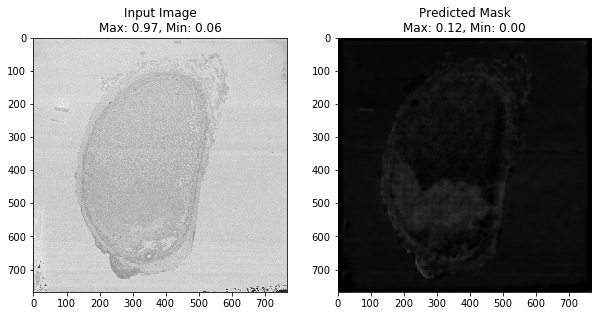

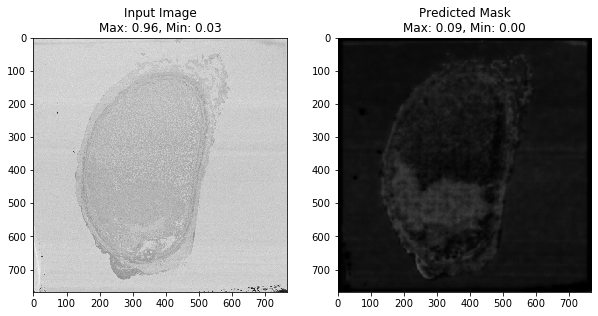

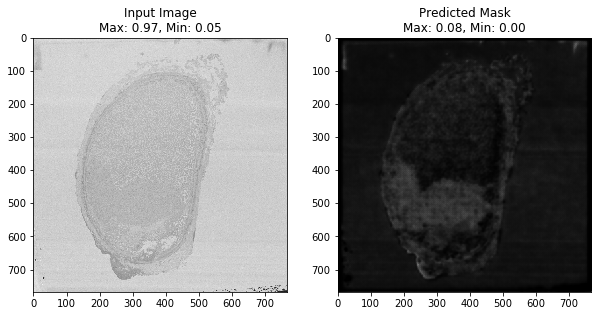

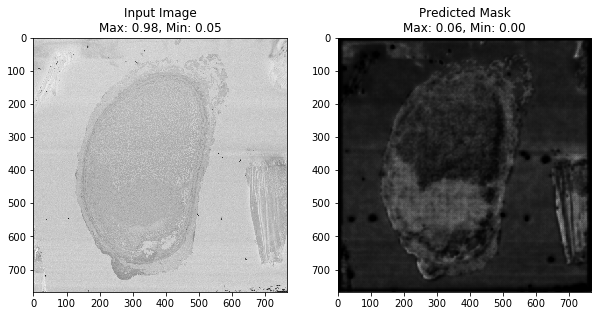

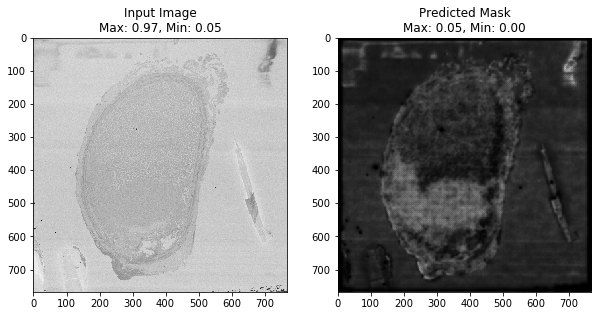

...

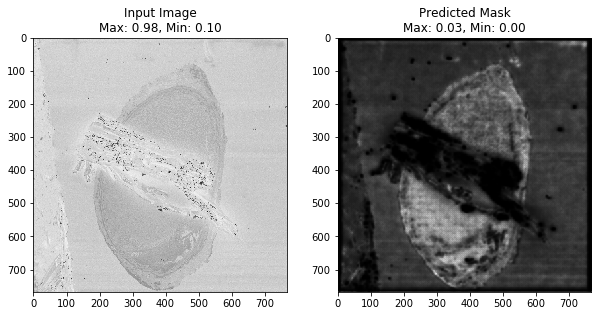

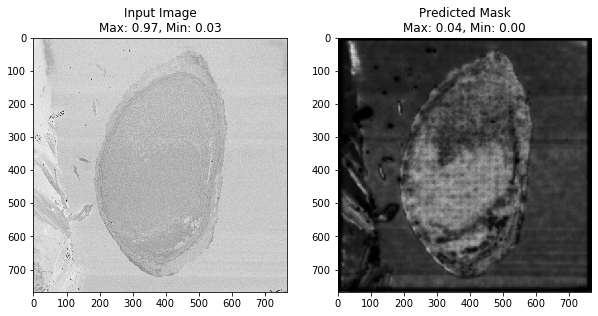

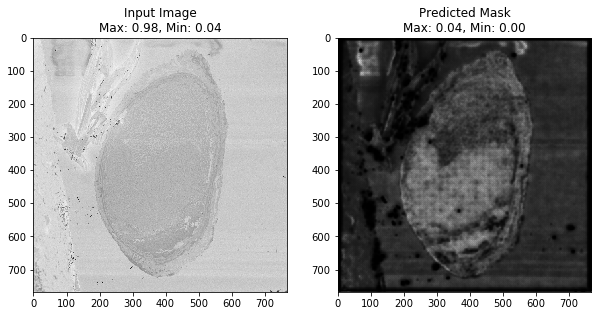

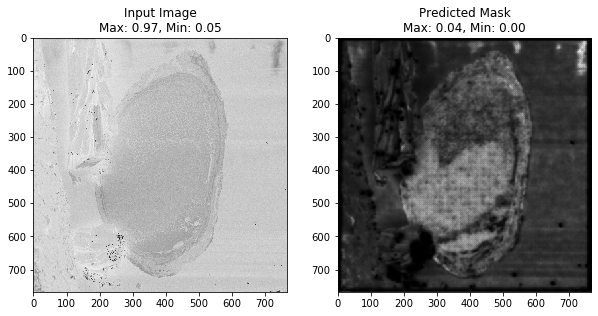

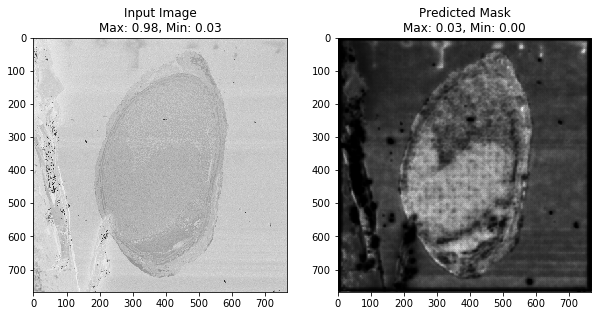

IndexError: index 84 is out of bounds for axis 0 with size 84

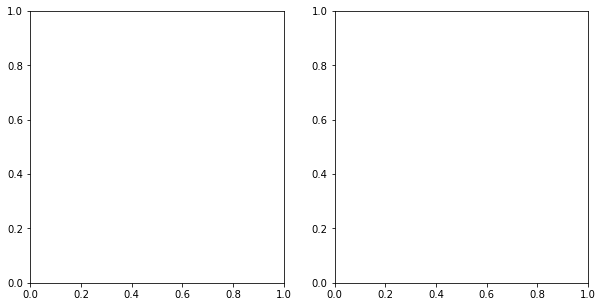

In [7]:
for i in range(100):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # Get input image and predictions
    input_image = segment_dataset[i].permute(1, 2, 0).numpy()
    predicted_mask = 10*predictions[i]
    
    # Calculate max and min values
    input_max, input_min = input_image.max(), input_image.min()
    pred_max, pred_min = predicted_mask.max(), predicted_mask.min()
    
    # Display input image
    axes[0].imshow(input_image, cmap='gray')
    axes[0].set_title(f'Input Image\nMax: {input_max:.2f}, Min: {input_min:.2f}')
    
    # Display predicted mask
    axes[1].imshow(predicted_mask, cmap='gray')
    axes[1].set_title(f'Predicted Mask\nMax: {pred_max:.2f}, Min: {pred_min:.2f}')
    
    plt.show()


Epoch 1/3, Loss: 0.0
Epoch 2/3, Loss: 0.0
Epoch 3/3, Loss: 0.0


AttributeError: 'tensorflow.python.framework.ops.EagerTensor' object has no attribute 'squeeze'

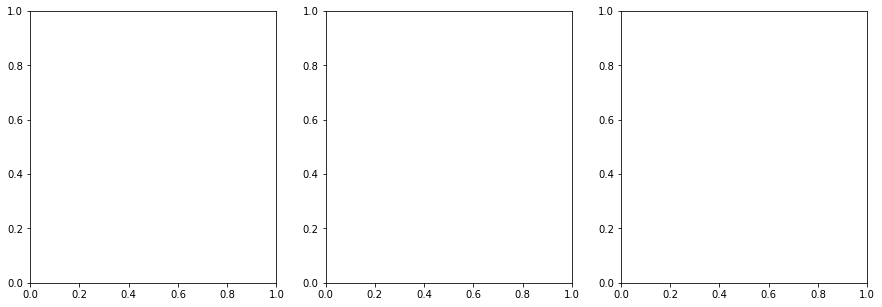

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread
import tensorflow as tf
from tensorflow.keras import layers, models, losses, optimizers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.utils import Sequence

# Custom Dataset class to handle TIFF stacks
class TiffDataset(Sequence):
    def __init__(self, image_path, mask_path, batch_size, transform=None):
        self.images = imread(image_path)
        self.masks = imread(mask_path)
        self.batch_size = batch_size
        self.transform = transform

    def __len__(self):
        return int(np.ceil(len(self.images) / self.batch_size))

    def __getitem__(self, idx):
        batch_images = self.images[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_masks = self.masks[idx * self.batch_size:(idx + 1) * self.batch_size]

        # Convert single-channel images to three channels
        batch_images = np.stack([np.stack([img] * 3, axis=-1) for img in batch_images])

        if self.transform:
            batch_images = self.transform(batch_images)
            batch_masks = self.transform(batch_masks)

        # Ensure the mask is a single channel
        batch_masks = np.expand_dims(batch_masks, axis=-1)

        return batch_images, batch_masks

# Define the U-Net model with ResNet18 backbone
def unet_resnet50(input_shape, n_classes):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Encoder
    encoder1 = base_model.get_layer("conv1_relu").output
    encoder2 = base_model.get_layer("conv2_block3_out").output
    encoder3 = base_model.get_layer("conv3_block4_out").output
    encoder4 = base_model.get_layer("conv4_block6_out").output
    encoder5 = base_model.get_layer("conv5_block3_out").output
    
    # Center
    center = layers.Conv2D(512, (3, 3), padding='same', activation='relu')(encoder5)
    center = layers.Conv2D(512, (3, 3), padding='same', activation='relu')(center)

    # Decoder
    def decoder_block(x, skip, filters):
        x = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
        x = layers.concatenate([x, skip])
        x = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(x)
        x = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(x)
        return x

    dec5 = decoder_block(center, encoder4, 512)
    dec4 = decoder_block(dec5, encoder3, 256)
    dec3 = decoder_block(dec4, encoder2, 128)
    dec2 = decoder_block(dec3, encoder1, 64)
    dec1 = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(dec2)
    dec1 = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(dec1)

    final = layers.Conv2D(n_classes, (1, 1), activation='sigmoid')(dec1)
    
    def resize_layer(x):
        return tf.image.resize(x, [input_shape[0], input_shape[1]])

    final = layers.Lambda(resize_layer)(final)

    model = models.Model(inputs=base_model.input, outputs=final)
    return model

# Transformations
def preprocess_images(images):
    images = tf.image.resize(images, (768, 768))
    return images / 255.0

# Load dataset
batch_size = 4
dataset = TiffDataset('./data/pin2_LowResImgs_Aligned_B+C_Adjusted-1.tif', './data/VesselWall.tif', batch_size, transform=preprocess_images)

# Initialize the model, loss function, and optimizer
input_shape = (768, 768, 3)
model = unet_resnet50(input_shape, 1)
model.compile(optimizer=optimizers.Adam(learning_rate=0.001), loss=losses.BinaryCrossentropy())

# Training loop
num_epochs = 3
for epoch in range(num_epochs):
    epoch_loss = 0
    for images, masks in dataset:
        # Ensure images and masks have the same batch size
        if images.shape[0] != masks.shape[0]:
            continue
        loss = model.train_on_batch(images, masks)
        epoch_loss += loss
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss/len(dataset)}')

# Save the trained model
model.save('unet_resnet50.h5')

# Visualize some predictions
for i in range(3):
    image, mask = dataset[i]
    prediction = model.predict(image)
    prediction = prediction.squeeze()

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image[0].squeeze(), cmap='gray')
    axes[0].set_title('Input Image')
    axes[1].imshow(mask[0].squeeze(), cmap='gray')
    axes[1].set_title('Ground Truth')
    axes[2].imshow(prediction > 0.5, cmap='gray')
    axes[2].set_title('Prediction')
    plt.show()
